In [1]:
# AI-Based Crop Disease Detection

## 1. Importing Required Libraries

In [2]:
pip install datasets


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 26.0.1 -> 26.2.1
[notice] To update, run: D:\PythonWork\Pytorch and deep learning\.venv\Scripts\python.exe -m pip install --upgrade pip


In [3]:
import sys
import subprocess

subprocess.check_call([
    sys.executable, "-m", "pip", "install",
    "torch", "torchvision", "torchaudio"
])

0

In [4]:
!python -m pip show torch

Name: torch
Version: 2.13.0
Summary: Tensors and Dynamic neural networks in Python with strong GPU acceleration
Home-page: https://pytorch.org
Author: 
Author-email: PyTorch Team <packages@pytorch.org>
License-Expression: Apache-2.0 AND Apache-2.0 WITH LLVM-exception AND BSD-2-Clause AND BSD-3-Clause AND BSL-1.0 AND MIT
Location: C:\Users\Siddhi Gundecha\AppData\Local\Programs\Python\Python314\Lib\site-packages
Requires: filelock, fsspec, jinja2, networkx, setuptools, sympy, typing-extensions
Required-by: torchmetrics


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models

In [12]:
train_path = r"D:\Projects\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\train"

valid_path = r"D:\Projects\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\valid"

In [13]:
print(os.path.exists(train_path))
print(os.path.exists(valid_path))

True
True


In [14]:
from torchvision import transforms

train_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
     transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

valid_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [15]:
from torchvision.datasets import ImageFolder
train_dataset = datasets.ImageFolder(
    train_path, 
    transform = train_transform
)
valid_dataset = datasets.ImageFolder(
    valid_path, 
    transform = valid_transform
)
print("Training images:", len(train_dataset))
print("Validation images:", len(valid_dataset))
print("Classes:", len(train_dataset.classes))

Training images: 70295
Validation images: 17572
Classes: 38


In [16]:
print(train_path)
print(valid_path)

print(os.path.abspath(train_path))
print(os.path.abspath(valid_path))

D:\Projects\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\train
D:\Projects\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\valid
D:\Projects\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\train
D:\Projects\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\valid


In [17]:
from collections import Counter

train_counts = Counter(train_dataset.targets)
valid_counts = Counter(valid_dataset.targets)

for i, class_name in enumerate(train_dataset.classes):
    print(
        f"{class_name}: "
        f"Train={train_counts[i]}, "
        f"Valid={valid_counts[i]}"
    )

Apple___Apple_scab: Train=2016, Valid=504
Apple___Black_rot: Train=1987, Valid=497
Apple___Cedar_apple_rust: Train=1760, Valid=440
Apple___healthy: Train=2008, Valid=502
Blueberry___healthy: Train=1816, Valid=454
Cherry_(including_sour)___Powdery_mildew: Train=1683, Valid=421
Cherry_(including_sour)___healthy: Train=1826, Valid=456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: Train=1642, Valid=410
Corn_(maize)___Common_rust_: Train=1907, Valid=477
Corn_(maize)___Northern_Leaf_Blight: Train=1908, Valid=477
Corn_(maize)___healthy: Train=1859, Valid=465
Grape___Black_rot: Train=1888, Valid=472
Grape___Esca_(Black_Measles): Train=1920, Valid=480
Grape___Leaf_blight_(Isariopsis_Leaf_Spot): Train=1722, Valid=430
Grape___healthy: Train=1692, Valid=423
Orange___Haunglongbing_(Citrus_greening): Train=2010, Valid=503
Peach___Bacterial_spot: Train=1838, Valid=459
Peach___healthy: Train=1728, Valid=432
Pepper,_bell___Bacterial_spot: Train=1913, Valid=478
Pepper,_bell___healthy: Train=1988, 

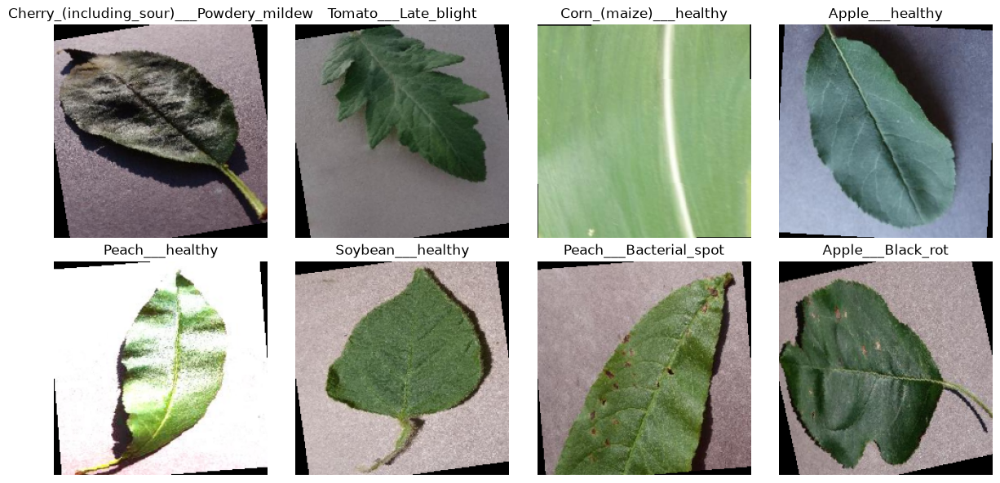

In [18]:
import matplotlib.pyplot as plt

images, labels = next(iter(DataLoader(train_dataset, batch_size=8, shuffle=True)))

plt.figure(figsize=(12, 6))

for i in range(8):
    plt.subplot(2, 4, i + 1)
    
    # Unnormalize for display
    img = images[i].permute(1, 2, 0)
    img = img * torch.tensor([0.229, 0.224, 0.225]) + torch.tensor([0.485, 0.456, 0.406])
    img = torch.clamp(img, 0, 1)
    
    plt.imshow(img)
    plt.title(train_dataset.classes[labels[i]])
    plt.axis("off")

plt.tight_layout()
plt.show()

In [19]:
train_loader = DataLoader(
    train_dataset,
    batch_size = 32,
    shuffle = True,
    num_workers = 0
)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=0
)

print("Training batches:", len(train_loader))
print("Validation batches:", len(valid_loader))

Training batches: 2197
Validation batches: 550


In [20]:
images , labels = next(iter(train_loader))
print("Image batch shape:", images.shape)
print("Label batch shape:", labels.shape)


Image batch shape: torch.Size([32, 3, 224, 224])
Label batch shape: torch.Size([32])


In [21]:
from torchvision.models import resnet50 , ResNet50_Weights

weights = ResNet50_Weights.DEFAULT
model = resnet50(weights = weights)

print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [22]:
num_classes = len(train_dataset.classes)

model.fc = nn.Linear(model.fc.in_features , num_classes)

print(model.fc)

Linear(in_features=2048, out_features=38, bias=True)


In [23]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device", device)

device cuda


In [24]:
model = model.to(device)

In [25]:
print("device", device)

device cuda


In [26]:
loss = nn.CrossEntropyLoss()

In [27]:
optimizer = optim.Adam(model.parameters() , lr = 0.0001)

In [22]:
def train(
    model,
    train_dataloader,
    valid_dataloader,
    optimizer,
    loss_fn,
    epochs,
    device
):
    
    results = {
        "train_loss": [],
        "train_acc": [],
        "valid_loss": [],
        "valid_acc": []
    }

    for epoch in range(epochs):

        
        # TRAINING
       
        model.train()

        train_loss = 0
        train_correct = 0
        train_total = 0

        for images, labels in train_dataloader:

            images = images.to(device)
            labels = labels.to(device)

            
            outputs = model(images)

            
            loss = loss_fn(outputs, labels)

            
            train_loss += loss.item()

            
            optimizer.zero_grad()

            # Backpropagation
            loss.backward()

            # Update weights
            optimizer.step()

            # Predictions
            predicted = torch.argmax(outputs, dim=1)

            # Count correct predictions
            train_correct += (predicted == labels).sum().item()
            train_total += labels.size(0)

        # Average training loss
        train_loss = train_loss / len(train_dataloader)

        # Training accuracy
        train_acc = train_correct / train_total


        
        # VALIDATION
        
        model.eval()

        valid_loss = 0
        valid_correct = 0
        valid_total = 0

        with torch.inference_mode():

            for images, labels in valid_dataloader:

                # Move data to GPU
                images = images.to(device)
                labels = labels.to(device)

                # Forward pass
                outputs = model(images)

                # Calculate loss
                loss = loss_fn(outputs, labels)

                # Add loss
                valid_loss += loss.item()

                # Predictions
                predicted = torch.argmax(outputs, dim=1)

                # Count correct predictions
                valid_correct += (predicted == labels).sum().item()
                valid_total += labels.size(0)

        # Average validation loss
        valid_loss = valid_loss / len(valid_dataloader)

        # Validation accuracy
        valid_acc = valid_correct / valid_total


        # =========================
        # SAVE RESULTS
        # =========================

        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)

        results["valid_loss"].append(valid_loss)
        results["valid_acc"].append(valid_acc)


        # =========================
        # PRINT RESULTS
        # =========================

        print(
            f"Epoch: {epoch+1}/{epochs} | "
            f"Train Loss: {train_loss:.4f} | "
            f"Train Acc: {train_acc*100:.2f}% | "
            f"Valid Loss: {valid_loss:.4f} | "
            f"Valid Acc: {valid_acc*100:.2f}%"
        )

    return results 

In [23]:
# Freeze all layers
for param in model.parameters():
    param.requires_grad = False

# Train only the final classification layer
for param in model.fc.parameters():
    param.requires_grad = True

In [24]:
# Unfreeze the last convolutional block
for param in model.layer4.parameters():
    param.requires_grad = True

# Keep the final classification layer trainable
for param in model.fc.parameters():
    param.requires_grad = True

In [25]:
optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=0.0001
)

In [26]:
results_finetune = train(
    model=model,
    train_dataloader=train_loader,
    valid_dataloader=valid_loader,
    optimizer=optimizer,
    loss_fn=loss,
    epochs=3,
    device=device
)

Epoch: 1/3 | Train Loss: 0.2459 | Train Acc: 94.18% | Valid Loss: 0.0289 | Valid Acc: 99.10%
Epoch: 2/3 | Train Loss: 0.0369 | Train Acc: 98.85% | Valid Loss: 0.0203 | Valid Acc: 99.29%
Epoch: 3/3 | Train Loss: 0.0246 | Train Acc: 99.25% | Valid Loss: 0.0207 | Valid Acc: 99.34%


In [27]:
torch.save(model.state_dict() , "plant_disease_resnet50.pth")
print("Model saved successfully!")

Model saved successfully!


In [28]:
import os

print(os.path.exists("plant_disease_resnet50.pth"))

True


In [29]:
model.eval()

all_predictions = []
all_labels = []
all_confidences = []

with torch.inference_mode():
    for images, labels in valid_loader:

        images = images.to(device)
        labels = labels.to(device)

        # Model prediction
        outputs = model(images)

        # Convert scores into probabilities
        probabilities = torch.softmax(outputs, dim=1)

        # Highest probability = predicted class
        confidences, predictions = torch.max(probabilities, dim=1)

        # Store results
        all_predictions.extend(predictions.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_confidences.extend(confidences.cpu().numpy())

print("Predictions completed!")

Predictions completed!


In [30]:
for i in range(10):

    actual = valid_dataset.classes[all_labels[i]]
    predicted = valid_dataset.classes[all_predictions[i]]
    confidence = all_confidences[i] * 100

    print(f"Actual: {actual}")
    print(f"Predicted: {predicted}")
    print(f"Confidence: {confidence:.2f}%")
    print("-" * 50)

Actual: Apple___Apple_scab
Predicted: Apple___Apple_scab
Confidence: 100.00%
--------------------------------------------------
Actual: Apple___Apple_scab
Predicted: Apple___Apple_scab
Confidence: 100.00%
--------------------------------------------------
Actual: Apple___Apple_scab
Predicted: Apple___Apple_scab
Confidence: 100.00%
--------------------------------------------------
Actual: Apple___Apple_scab
Predicted: Apple___Apple_scab
Confidence: 99.97%
--------------------------------------------------
Actual: Apple___Apple_scab
Predicted: Apple___Apple_scab
Confidence: 98.85%
--------------------------------------------------
Actual: Apple___Apple_scab
Predicted: Apple___Apple_scab
Confidence: 99.86%
--------------------------------------------------
Actual: Apple___Apple_scab
Predicted: Apple___Apple_scab
Confidence: 99.61%
--------------------------------------------------
Actual: Apple___Apple_scab
Predicted: Apple___Apple_scab
Confidence: 100.00%
-------------------------------

In [31]:
import random

indices = random.sample(range(len(valid_dataset)), 20)

for i in indices:

    actual = valid_dataset.classes[all_labels[i]]
    predicted = valid_dataset.classes[all_predictions[i]]
    confidence = all_confidences[i] * 100

    print(f"Actual: {actual}")
    print(f"Predicted: {predicted}")
    print(f"Confidence: {confidence:.2f}%")
    print("-" * 50)

Actual: Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
Predicted: Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
Confidence: 100.00%
--------------------------------------------------
Actual: Grape___Esca_(Black_Measles)
Predicted: Grape___Esca_(Black_Measles)
Confidence: 100.00%
--------------------------------------------------
Actual: Apple___healthy
Predicted: Apple___healthy
Confidence: 100.00%
--------------------------------------------------
Actual: Potato___healthy
Predicted: Potato___healthy
Confidence: 99.99%
--------------------------------------------------
Actual: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Predicted: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Confidence: 100.00%
--------------------------------------------------
Actual: Tomato___Target_Spot
Predicted: Tomato___Early_blight
Confidence: 98.16%
--------------------------------------------------
Actual: Cherry_(including_sour)___Powdery_mildew
Predicted: Cherry_(including_sour)___Powdery_mildew
Confid

In [32]:
from sklearn.metrics import classification_report

print(
    classification_report(
        all_labels,
        all_predictions,
        target_names=valid_dataset.classes
    )
)

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      1.00      1.00       504
                                 Apple___Black_rot       1.00      1.00      1.00       497
                          Apple___Cedar_apple_rust       0.99      1.00      1.00       440
                                   Apple___healthy       1.00      1.00      1.00       502
                               Blueberry___healthy       1.00      1.00      1.00       454
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00       421
                 Cherry_(including_sour)___healthy       1.00      1.00      1.00       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.90      0.99      0.94       410
                       Corn_(maize)___Common_rust_       1.00      0.99      1.00       477
               Corn_(maize)___Northern_Leaf_Blight       0.98      0.91      0.

In [44]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(all_labels, all_predictions)

for i in range(len(valid_dataset.classes)):
    for j in range(len(valid_dataset.classes)):

        if i != j and cm[i, j] > 0:
            print(
                f"Actual: {valid_dataset.classes[i]} "
                f"-> Predicted: {valid_dataset.classes[j]} "
                f"= {cm[i, j]} images"
            )

Actual: Apple___Apple_scab -> Predicted: Apple___healthy = 1 images
Actual: Cherry_(including_sour)___Powdery_mildew -> Predicted: Apple___healthy = 1 images
Actual: Cherry_(including_sour)___Powdery_mildew -> Predicted: Potato___Late_blight = 1 images
Actual: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot -> Predicted: Corn_(maize)___Northern_Leaf_Blight = 6 images
Actual: Corn_(maize)___Common_rust_ -> Predicted: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot = 2 images
Actual: Corn_(maize)___Common_rust_ -> Predicted: Corn_(maize)___Northern_Leaf_Blight = 1 images
Actual: Corn_(maize)___Northern_Leaf_Blight -> Predicted: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot = 44 images
Actual: Grape___Black_rot -> Predicted: Grape___Esca_(Black_Measles) = 1 images
Actual: Peach___Bacterial_spot -> Predicted: Strawberry___Leaf_scorch = 1 images
Actual: Pepper,_bell___healthy -> Predicted: Apple___Cedar_apple_rust = 2 images
Actual: Tomato___Bacterial_spot -> Predicted: Tomato___

In [45]:
import numpy as np

cm = confusion_matrix(all_labels, all_predictions)

for i in range(len(valid_dataset.classes)):
    for j in range(len(valid_dataset.classes)):
        
        if i != j and cm[i, j] > 0:
            print(
                f"Actual: {valid_dataset.classes[i]} "
                f"→ Predicted: {valid_dataset.classes[j]} "
                f"= {cm[i, j]} images"
            )

Actual: Apple___Apple_scab → Predicted: Apple___healthy = 1 images
Actual: Cherry_(including_sour)___Powdery_mildew → Predicted: Apple___healthy = 1 images
Actual: Cherry_(including_sour)___Powdery_mildew → Predicted: Potato___Late_blight = 1 images
Actual: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot → Predicted: Corn_(maize)___Northern_Leaf_Blight = 6 images
Actual: Corn_(maize)___Common_rust_ → Predicted: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot = 2 images
Actual: Corn_(maize)___Common_rust_ → Predicted: Corn_(maize)___Northern_Leaf_Blight = 1 images
Actual: Corn_(maize)___Northern_Leaf_Blight → Predicted: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot = 44 images
Actual: Grape___Black_rot → Predicted: Grape___Esca_(Black_Measles) = 1 images
Actual: Peach___Bacterial_spot → Predicted: Strawberry___Leaf_scorch = 1 images
Actual: Pepper,_bell___healthy → Predicted: Apple___Cedar_apple_rust = 2 images
Actual: Tomato___Bacterial_spot → Predicted: Tomato___Tomato_Yell

Total wrong predictions: 116


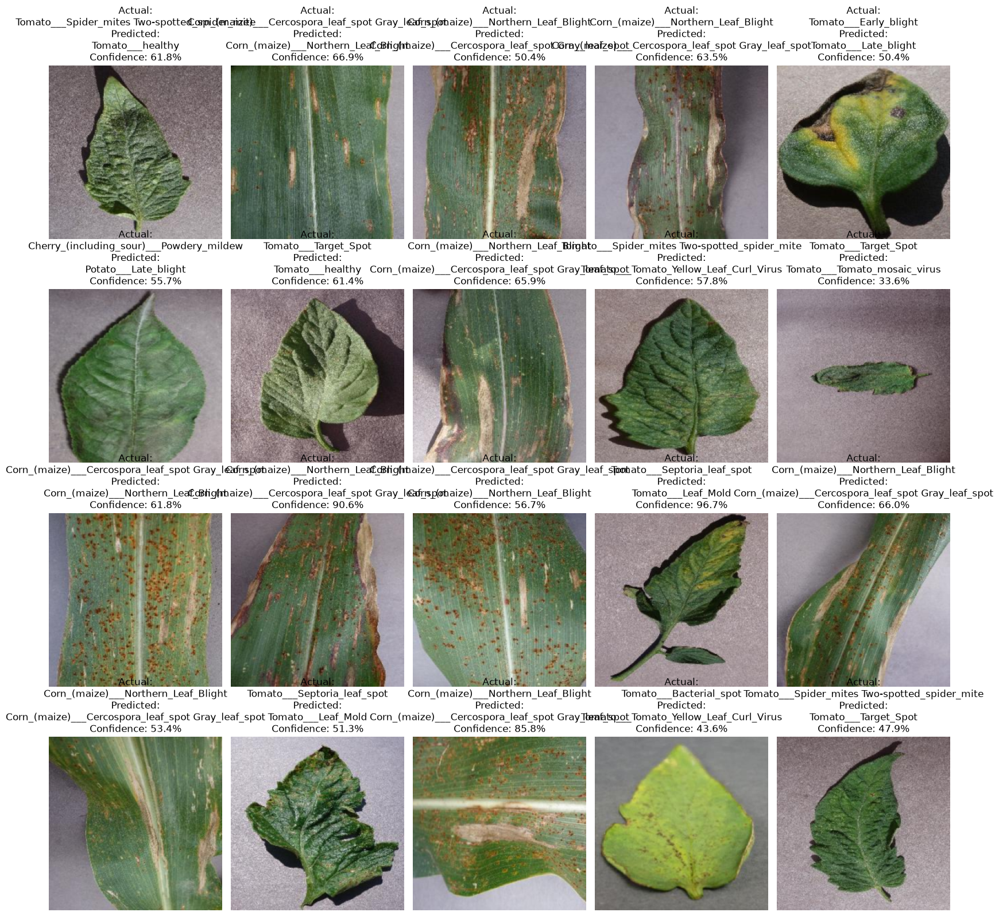

In [46]:
import matplotlib.pyplot as plt
import random

# Get indices of wrongly classified images
wrong_indices = [
    i for i in range(len(all_labels))
    if all_labels[i] != all_predictions[i]
]

print("Total wrong predictions:", len(wrong_indices))

# Show 20 random wrong predictions
sample_indices = random.sample(wrong_indices, min(20, len(wrong_indices)))

plt.figure(figsize=(16, 16))

for plot_no, idx in enumerate(sample_indices):

    # Get image and label
    image, actual_label = valid_dataset[idx]

    # Undo normalization so image looks normal
    image = image.permute(1, 2, 0)

    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    image = image * torch.tensor(std) + torch.tensor(mean)
    image = torch.clamp(image, 0, 1)

    actual = valid_dataset.classes[all_labels[idx]]
    predicted = valid_dataset.classes[all_predictions[idx]]
    confidence = all_confidences[idx] * 100

    plt.subplot(4, 5, plot_no + 1)
    plt.imshow(image)
    plt.title(
        f"Actual:\n{actual}\n"
        f"Predicted:\n{predicted}\n"
        f"Confidence: {confidence:.1f}%"
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

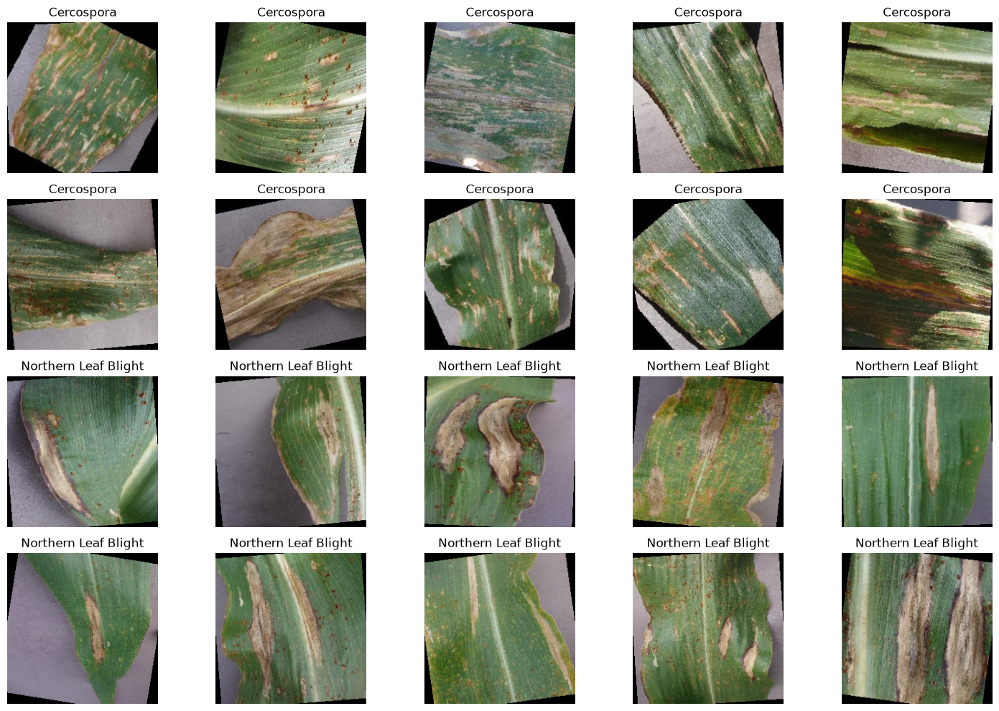

In [47]:
import matplotlib.pyplot as plt
import random
import torch

# Class names
class_names = train_dataset.classes

cercospora_idx = class_names.index(
    "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot"
)

northern_idx = class_names.index(
    "Corn_(maize)___Northern_Leaf_Blight"
)

# Get indices of both classes
cercospora_indices = [
    i for i, label in enumerate(train_dataset.targets)
    if label == cercospora_idx
]

northern_indices = [
    i for i, label in enumerate(train_dataset.targets)
    if label == northern_idx
]

# Randomly select 10 from each
cercospora_samples = random.sample(cercospora_indices, 10)
northern_samples = random.sample(northern_indices, 10)


# Function to display image correctly
def show_image(image):
    image = image.permute(1, 2, 0)

    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])

    image = image * std + mean
    image = torch.clamp(image, 0, 1)

    return image


# Plot
plt.figure(figsize=(15, 10))

for i, idx in enumerate(cercospora_samples):

    image, label = train_dataset[idx]

    image = show_image(image)

    plt.subplot(4, 5, i + 1)
    plt.imshow(image)
    plt.title("Cercospora")
    plt.axis("off")


for i, idx in enumerate(northern_samples):

    image, label = train_dataset[idx]

    image = show_image(image)

    plt.subplot(4, 5, i + 11)
    plt.imshow(image)
    plt.title("Northern Leaf Blight")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [48]:
import matplotlib.pyplot as plt
import torch

northern_idx = valid_dataset.classes.index(
    "Corn_(maize)___Northern_Leaf_Blight"
)

cercospora_idx = valid_dataset.classes.index(
    "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot"
)

# Find exactly these misclassified images
wrong_northern_to_cercospora = [
    i for i in range(len(all_labels))
    if all_labels[i] == northern_idx
    and all_predictions[i] == cercospora_idx
]

print("Northern Leaf Blight → Cercospora:",
      len(wrong_northern_to_cercospora))

Northern Leaf Blight → Cercospora: 44


ValueError: num must be an integer with 1 <= num <= 20, not 21

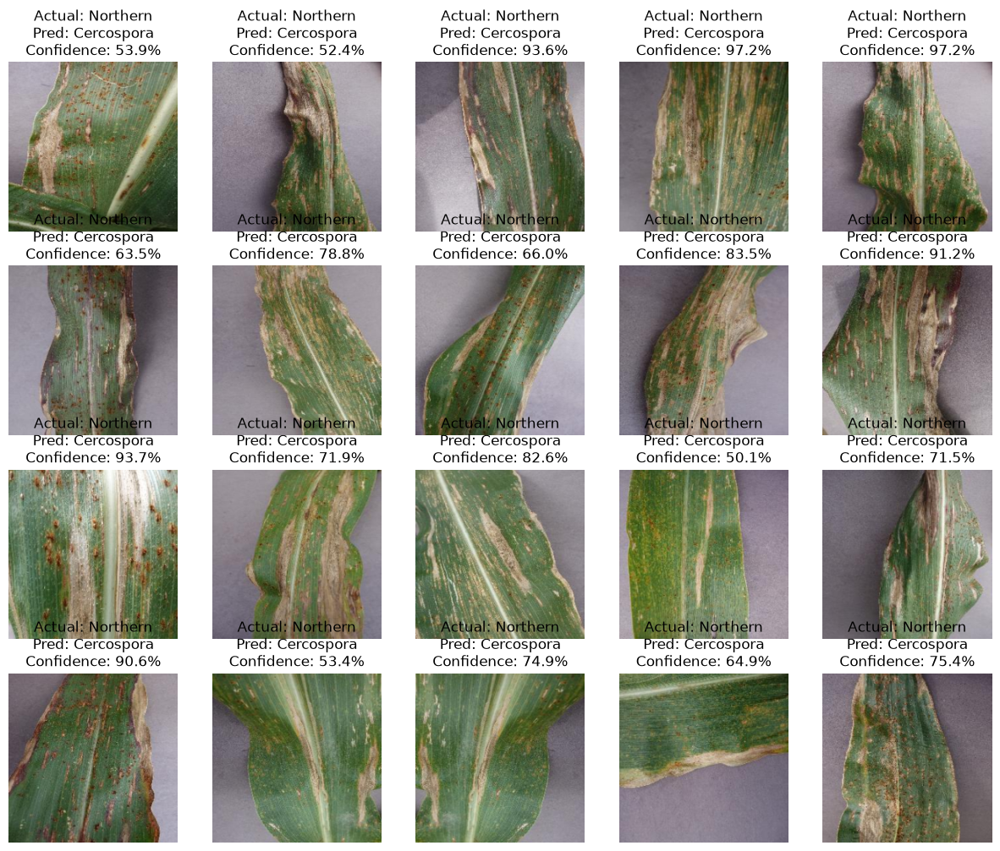

In [49]:
plt.figure(figsize=(15, 12))

for plot_no, idx in enumerate(wrong_northern_to_cercospora):

    image, label = valid_dataset[idx]

    # Undo normalization
    image = image.permute(1, 2, 0)

    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])

    image = image * std + mean
    image = torch.clamp(image, 0, 1)

    confidence = all_confidences[idx] * 100

    plt.subplot(4, 5, plot_no + 1)
    plt.imshow(image)

    plt.title(
        f"Actual: Northern\n"
        f"Pred: Cercospora\n"
        f"Confidence: {confidence:.1f}%"
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [50]:
torch.save(model.state_dict(), "plant_disease_resnet50_baseline.pth")

In [51]:
for param in model.layer3.parameters():
    param.requires_grad = True

In [52]:
optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=0.00005
)

In [53]:
results_finetune_v2 = train(
    model=model,
    train_dataloader=train_loader,
    valid_dataloader=valid_loader,
    optimizer=optimizer,
    loss_fn=loss,
    epochs=3,
    device=device
)

Epoch: 1/3 | Train Loss: 0.0153 | Train Acc: 99.53% | Valid Loss: 0.0178 | Valid Acc: 99.54%
Epoch: 2/3 | Train Loss: 0.0095 | Train Acc: 99.69% | Valid Loss: 0.0087 | Valid Acc: 99.72%
Epoch: 3/3 | Train Loss: 0.0074 | Train Acc: 99.79% | Valid Loss: 0.0171 | Valid Acc: 99.49%


In [54]:
model.eval()

all_predictions_v2 = []
all_labels_v2 = []
all_confidences_v2 = []

with torch.inference_mode():

    for images, labels in valid_loader:

        images = images.to(device)
        labels = labels.to(device)

        # Model prediction
        outputs = model(images)

        # Convert scores into probabilities
        probabilities = torch.softmax(outputs, dim=1)

        # Get predicted class and confidence
        confidences, predictions = torch.max(probabilities, dim=1)

        # Store results
        all_predictions_v2.extend(predictions.cpu().numpy())
        all_labels_v2.extend(labels.cpu().numpy())
        all_confidences_v2.extend(confidences.cpu().numpy())

print("Predictions completed!")

Predictions completed!


In [55]:
import random

indices = random.sample(range(len(valid_dataset)), 20)

for i in indices:

    actual = valid_dataset.classes[all_labels_v2[i]]
    predicted = valid_dataset.classes[all_predictions_v2[i]]
    confidence = all_confidences_v2[i] * 100

    print(f"Actual: {actual}")
    print(f"Predicted: {predicted}")
    print(f"Confidence: {confidence:.2f}%")
    print("-" * 60)

Actual: Tomato___Bacterial_spot
Predicted: Tomato___Bacterial_spot
Confidence: 100.00%
------------------------------------------------------------
Actual: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Predicted: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Confidence: 100.00%
------------------------------------------------------------
Actual: Tomato___Early_blight
Predicted: Tomato___Late_blight
Confidence: 98.90%
------------------------------------------------------------
Actual: Pepper,_bell___Bacterial_spot
Predicted: Pepper,_bell___Bacterial_spot
Confidence: 100.00%
------------------------------------------------------------
Actual: Cherry_(including_sour)___healthy
Predicted: Cherry_(including_sour)___healthy
Confidence: 100.00%
------------------------------------------------------------
Actual: Potato___healthy
Predicted: Potato___healthy
Confidence: 100.00%
------------------------------------------------------------
Actual: Apple___healthy
Predicted: Apple___hea

In [57]:
corn_classes = [
    "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot",
    "Corn_(maize)___Common_rust_",
    "Corn_(maize)___Northern_Leaf_Blight",
    "Corn_(maize)___healthy"
]

for i in range(len(all_labels_v2)):

    actual = valid_dataset.classes[all_labels_v2[i]]
    predicted = valid_dataset.classes[all_predictions_v2[i]]

    if actual in corn_classes:
        if actual != predicted:
            print(f"Actual: {actual}")
            print(f"Predicted: {predicted}")
            print(f"Confidence: {all_confidences_v2[i] * 100:.2f}%")
            print("-" * 60)

Actual: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Predicted: Corn_(maize)___Northern_Leaf_Blight
Confidence: 56.24%
------------------------------------------------------------
Actual: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Predicted: Corn_(maize)___Northern_Leaf_Blight
Confidence: 97.37%
------------------------------------------------------------
Actual: Corn_(maize)___Northern_Leaf_Blight
Predicted: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Confidence: 96.58%
------------------------------------------------------------
Actual: Corn_(maize)___Northern_Leaf_Blight
Predicted: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Confidence: 62.43%
------------------------------------------------------------
Actual: Corn_(maize)___Northern_Leaf_Blight
Predicted: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Confidence: 77.66%
------------------------------------------------------------
Actual: Corn_(maize)___Northern_Leaf_Blight
Predicted: Corn_(maize)___

In [58]:
from collections import Counter

train_counts = Counter(train_dataset.targets)

print(
    "Cercospora:",
    train_counts[cercospora_idx]
)

print(
    "Northern Leaf Blight:",
    train_counts[northern_idx]
)

Cercospora: 1642
Northern Leaf Blight: 1908


In [59]:
torch.save(
    model.state_dict(),
    "plant_disease_resnet50_layer3_best.pth"
)

In [60]:
cercospora_to_northern = [
    i for i in range(len(all_labels_v2))
    if all_labels_v2[i] == cercospora_idx
    and all_predictions_v2[i] == northern_idx
]

print("Cercospora → Northern:", len(cercospora_to_northern))

Cercospora → Northern: 2


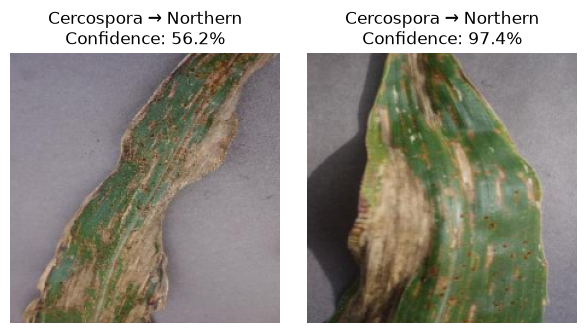

In [61]:
plt.figure(figsize=(15, 12))

for plot_no, idx in enumerate(cercospora_to_northern):

    image, label = valid_dataset[idx]

    image = image.permute(1, 2, 0)

    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])

    image = image * std + mean
    image = torch.clamp(image, 0, 1)

    confidence = all_confidences_v2[idx] * 100

    plt.subplot(4, 5, plot_no + 1)
    plt.imshow(image)

    plt.title(
        f"Cercospora → Northern\n"
        f"Confidence: {confidence:.1f}%"
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

# Gradcam

In [62]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

In [63]:
target_layer = model.layer4[-1].conv3
print(target_layer)

Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)


# One clean Grad-CAM function

In [64]:
def generate_gradcam(model, dataset, image_index, target_layer, device):

    # Get image and true label
    image, true_label = dataset[image_index]

    # Add batch dimension and move to GPU
    image_input = image.unsqueeze(0).to(device)

    # Store activation and gradient
    activation = None
    gradient = None

    # Forward hook
    def forward_hook(module, input, output):
        nonlocal activation
        activation = output

    # Backward hook
    def backward_hook(module, grad_input, grad_output):
        nonlocal gradient
        gradient = grad_output[0]

    # Register hooks
    forward_handle = target_layer.register_forward_hook(forward_hook)
    backward_handle = target_layer.register_full_backward_hook(backward_hook)

    # Forward pass
    model.zero_grad()
    output = model(image_input)

    # Predicted class
    predicted_class = output.argmax(dim=1).item()

    # Score of predicted class
    score = output[0, predicted_class]

    # Backward pass
    score.backward()

    # Calculate Grad-CAM weights
    weights = gradient.mean(dim=(2, 3), keepdim=True)

    # Create CAM
    cam = (weights * activation).sum(dim=1, keepdim=True)

    # Keep positive contributions
    cam = F.relu(cam)

    # Resize CAM
    cam = F.interpolate(
        cam,
        size=(224, 224),
        mode="bilinear",
        align_corners=False
    )

    # Convert to NumPy
    cam = cam.squeeze().detach().cpu().numpy()

    # Normalize CAM
    cam = (
        (cam - cam.min())
        / (cam.max() - cam.min() + 1e-8)
    )

    # Undo image normalization
    image_display = image.permute(1, 2, 0).numpy()

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    image_display = image_display * std + mean
    image_display = np.clip(image_display, 0, 1)

    # Remove hooks
    forward_handle.remove()
    backward_handle.remove()

    return image_display, true_label, predicted_class, cam

In [76]:
def predict_with_gradcam(model, dataset, image_index, target_layer, device):

    image_display, true_label, predicted_class, cam = generate_gradcam(
        model=model,
        dataset=dataset,
        image_index=image_index,
        target_layer=target_layer,
        device=device
    )

    return {
        "true_class": dataset.classes[true_label],
        "predicted_class": dataset.classes[predicted_class],
        "image": image_display,
        "cam": cam
    }

In [77]:
result = predict_with_gradcam(
    model,
    valid_dataset,
    3294,
    target_layer,
    device
)

print("True:", result["true_class"])
print("Predicted:", result["predicted_class"])

True: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Predicted: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot


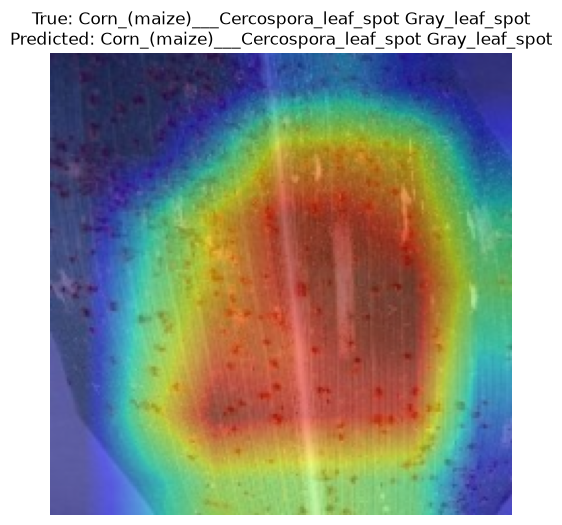

In [79]:
plt.figure(figsize=(6, 6))

plt.imshow(result["image"])
plt.imshow(result["cam"], cmap="jet", alpha=0.5)

plt.axis("off")

plt.title(
    f"True: {result['true_class']}\n"
    f"Predicted: {result['predicted_class']}"
)

plt.show()

In [2]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Device:", device)

Device: cuda


In [3]:
from torchvision.models import resnet50, ResNet50_Weights
import torch.nn as nn
import torch

# Create the same model architecture
model = resnet50(weights=None)

# Same number of classes
model.fc = nn.Linear(model.fc.in_features, 38)

# Load trained weights
model.load_state_dict(
    torch.load(
        "plant_disease_resnet50_layer3_best.pth",
        map_location=device
    )
)

model = model.to(device)
model.eval()

print("Model loaded successfully!")

Model loaded successfully!


In [6]:
from PIL import Image
import torch
import torch.nn.functional as F

def predict_image(model, image_path, transform, class_names, device):

    # Load image
    image = Image.open(image_path).convert("RGB")

    # Apply same preprocessing used during validation
    image_tensor = transform(image)

    # Add batch dimension and move to device
    image_tensor = image_tensor.unsqueeze(0).to(device)

    # Prediction
    model.eval()

    with torch.no_grad():
        output = model(image_tensor)

        probabilities = F.softmax(output, dim=1)

        predicted_class = probabilities.argmax(dim=1).item()

        confidence = probabilities[0, predicted_class].item()

    return {
        "predicted_class": class_names[predicted_class],
        "confidence": confidence,
        "image_tensor": image_tensor
    }

In [33]:
image_path = r"D:\Projects\test_images\corn.jpg"

In [34]:
result = predict_image(
    model,
    image_path,
    valid_transform,
    train_dataset.classes,
    device
)

print("Predicted Disease:", result["predicted_class"])
print(f"Confidence: {result['confidence'] * 100:.2f}%")

Predicted Disease: Blueberry___healthy
Confidence: 4.22%


In [31]:
def predict_top5(model, image_path, transform, class_names, device):

    from PIL import Image
    import torch
    import torch.nn.functional as F

    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image).unsqueeze(0).to(device)

    model.eval()

    with torch.no_grad():
        output = model(image_tensor)
        probabilities = F.softmax(output, dim=1)

    top5_prob, top5_indices = torch.topk(probabilities, 5, dim=1)

    for prob, idx in zip(top5_prob[0], top5_indices[0]):
        print(
            f"{class_names[idx.item()]} : "
            f"{prob.item() * 100:.2f}%"
        )

In [32]:
predict_top5(
    model,
    image_path,
    valid_transform,
    valid_dataset.classes,
    device
)

Grape___healthy : 3.17%
Tomato___Spider_mites Two-spotted_spider_mite : 3.15%
Strawberry___healthy : 3.12%
Blueberry___healthy : 3.10%
Grape___Esca_(Black_Measles) : 3.10%


In [35]:
# Get image directly from the validation dataset
image_tensor, true_label = valid_dataset[3294]

# Add batch dimension
image_tensor = image_tensor.unsqueeze(0).to(device)

model.eval()

with torch.no_grad():
    output = model(image_tensor)
    probabilities = torch.softmax(output, dim=1)

predicted_class = probabilities.argmax(dim=1).item()

print("True:", valid_dataset.classes[true_label])
print("Predicted:", valid_dataset.classes[predicted_class])
print(
    f"Confidence: "
    f"{probabilities[0, predicted_class].item() * 100:.2f}%"
)

True: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Predicted: Apple___healthy
Confidence: 3.60%


In [36]:
import os

print("Current folder:")
print(os.getcwd())

print("\nLayer3 file:")
print(os.path.abspath("plant_disease_resnet50_layer3_best.pth"))
print("Exists:", os.path.exists("plant_disease_resnet50_layer3_best.pth"))

if os.path.exists("plant_disease_resnet50_layer3_best.pth"):
    print("Size:", os.path.getsize("plant_disease_resnet50_layer3_best.pth"), "bytes")

Current folder:
D:\Projects\Agriculture

Layer3 file:
D:\Projects\Agriculture\plant_disease_resnet50_layer3_best.pth
Exists: True
Size: 94670433 bytes


In [37]:
print("\nBaseline file:")
print(os.path.abspath("plant_disease_resnet50_baseline.pth"))
print("Exists:", os.path.exists("plant_disease_resnet50_baseline.pth"))

if os.path.exists("plant_disease_resnet50_baseline.pth"):
    print("Size:", os.path.getsize("plant_disease_resnet50_baseline.pth"), "bytes")


Baseline file:
D:\Projects\Agriculture\plant_disease_resnet50_baseline.pth
Exists: True
Size: 94669455 bytes


In [38]:
import torch
import torch.nn as nn
from torchvision.models import resnet50

# Create fresh ResNet50
baseline_model = resnet50(weights=None)

# Same 38-class output layer
baseline_model.fc = nn.Linear(
    baseline_model.fc.in_features,
    38
)

# Load baseline checkpoint
baseline_model.load_state_dict(
    torch.load(
        "plant_disease_resnet50_baseline.pth",
        map_location=device
    )
)

baseline_model = baseline_model.to(device)
baseline_model.eval()

# Test validation image 3294
image_tensor, true_label = valid_dataset[3294]
image_tensor = image_tensor.unsqueeze(0).to(device)

with torch.no_grad():
    output = baseline_model(image_tensor)
    probabilities = torch.softmax(output, dim=1)

predicted_class = probabilities.argmax(dim=1).item()

print("True:", valid_dataset.classes[true_label])
print("Predicted:", valid_dataset.classes[predicted_class])
print(f"Confidence: {probabilities[0, predicted_class].item()*100:.2f}%")

True: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Predicted: Corn_(maize)___Northern_Leaf_Blight
Confidence: 56.78%


In [1]:

import sys
import torch

print("Python:", sys.executable)
print("Torch:", torch.__version__)
print("CUDA:", torch.cuda.is_available())

Python: D:\PythonWork\Pytorch and deep learning\.venv\Scripts\python.exe
Torch: 2.11.0+cu128
CUDA: True
